# 🔆 Solar Panel Efficiency Prediction

## 📌 Project Objective
Build a machine learning model to predict the energy output efficiency of solar panels using historical and real-time environmental and operational data.

---

### 📋 Project Details
| Category       | Information                |
|----------------|----------------------------|
| **Author**     | Ismail Otukoya             |
| **Platform**   | Jupyter Notebook           |
| **Domain**     | Renewable Energy Analytics |
| **Task**       | Regression     



## 🚀 Project Overview
This project aims to develop a predictive model for solar panel efficiency by analyzing various environmental and operational parameters. The model will help optimize solar energy production and maintenance scheduling.

Key Features:
- Comprehensive data preprocessing pipeline
- Multiple machine learning approaches
- Hyperparameter optimization
- Performance evaluation metrics            |.

---


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import KFold
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

import lightgbm as lgb
import xgboost as xgb
import optuna
import warnings
warnings.filterwarnings('ignore')


print("✅ Libraries loaded successfully.")


✅ Libraries loaded successfully.


In [3]:
# Load datasets
train = pd.read_csv(r"C:\Users\USER\Documents\Projects\Data Science Projects\Performance optimization of solar panels\1a513221-3-dataset\dataset\train.csv")
test = pd.read_csv(r"C:\Users\USER\Documents\Projects\Data Science Projects\Performance optimization of solar panels\1a513221-3-dataset\dataset\test.csv")
sample_submission = pd.read_csv(r"C:\Users\USER\Documents\Projects\Data Science Projects\Performance optimization of solar panels\1a513221-3-dataset\dataset\sample_submission.csv")

# Check shapes
print(f"Train shape: {train.shape}")
print(f"Test shape: {test.shape}")
print(f"Sample submission shape: {sample_submission.shape}")


Train shape: (20000, 17)
Test shape: (12000, 16)
Sample submission shape: (5, 2)


In [4]:
# Peek into the data
print(train.head())
print(test.head())

   id  temperature  irradiance            humidity  panel_age  \
0   0     7.817315  576.179270   41.24308670850264  32.135501   
1   1    24.785727  240.003973  1.3596482765960705  19.977460   
2   2    46.652695  687.612799   91.26536837560256   1.496401   
3   3    53.339567  735.141179   96.19095521176159  18.491582   
4   4     5.575374   12.241203  27.495073003585226  30.722697   

   maintenance_count  soiling_ratio    voltage   current  module_temperature  \
0                4.0       0.803199  37.403527  1.963787           13.691147   
1                8.0       0.479456  21.843315  0.241473           27.545096   
2                4.0       0.822398  48.222882  4.191800           43.363708   
3                3.0       0.837529  46.295748  0.960567           57.720436   
4                6.0       0.551833   0.000000  0.898062            6.786263   

   cloud_coverage          wind_speed            pressure string_id  \
0       62.494044   12.82491203459621  1018.8665053152533

In [5]:
# Summary of training data
train.describe()

# Check for missing values
print("Missing values in train:")
print(train.isnull().sum())

print("\nMissing values in test:")
print(test.isnull().sum())


Missing values in train:
id                       0
temperature           1001
irradiance             987
humidity                 0
panel_age             1011
maintenance_count     1027
soiling_ratio         1010
voltage                993
current                977
module_temperature     978
cloud_coverage        1010
wind_speed               0
pressure                 0
string_id                0
error_code            5912
installation_type     5028
efficiency               0
dtype: int64

Missing values in test:
id                       0
temperature            582
irradiance             615
humidity                 0
panel_age              607
maintenance_count      609
soiling_ratio          610
voltage                547
current                587
module_temperature     580
cloud_coverage         582
wind_speed               0
pressure                 0
string_id                0
error_code            3611
installation_type     2979
dtype: int64


## 🧼 Missing Value Handling Strategy

To maintain model accuracy and generalization, we will:
- Impute **numerical features** with the **median**
- Impute **categorical features** (`error_code`, `installation_type`) with `"Unknown"`


In [ ]:
for col in ['humidity', 'wind_speed', 'pressure']:
    train[col] = pd.to_numeric(train[col], errors='coerce')
    test[col] = pd.to_numeric(test[col], errors='coerce')

In [7]:
def preprocess(df, is_train=True):
    numeric_cols = ['temperature', 'irradiance', 'panel_age', 'maintenance_count',
                    'soiling_ratio', 'voltage', 'current', 'module_temperature', 'cloud_coverage',
                    'humidity', 'wind_speed', 'pressure']
    for col in numeric_cols:
        df[col] = df[col].fillna(train[col].median())

    df['error_code'] = df['error_code'].fillna("Unknown")
    df['installation_type'] = df['installation_type'].fillna("Unknown")

    df['temp_diff'] = df['module_temperature'] - df['temperature']
    df['irradiance_per_cloud'] = df['irradiance'] / (df['cloud_coverage'] + 1)
    df['maintenance_rate'] = df['maintenance_count'] / (df['panel_age'] + 1)
    df['voltage_norm'] = df['voltage'] / (df['irradiance'] + 1)
    df['current_norm'] = df['current'] / (df['irradiance'] + 1)

    for col in ['string_id', 'error_code', 'installation_type']:
        df[col] = LabelEncoder().fit_transform(df[col])

    return df




In [8]:
train = preprocess(train)
test = preprocess(test, is_train=False)
X = train.drop(columns=['id', 'efficiency'])
y = train['efficiency']
X_test = test.drop(columns=['id'])

In [9]:
def lgb_objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.05),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'random_state': 42,
        'n_jobs': -1
    }

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    rmse_scores = []

    for train_idx, val_idx in kf.split(X):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

        model = lgb.LGBMRegressor(**params)
        model.fit(X_train, y_train)
        preds = model.predict(X_val)
        rmse_scores.append(mean_squared_error(y_val, preds, squared=False))

    return np.mean(rmse_scores)

In [10]:
print("🔍 Optimizing LightGBM...")
lgb_study = optuna.create_study(direction='minimize')
lgb_study.optimize(lgb_objective, n_trials=50)
print("✅ Best LightGBM RMSE:", lgb_study.best_value)
print("🔧 Params:", lgb_study.best_params)

Train Data Types:
humidity      float64
wind_speed    float64
pressure      float64
dtype: object

Test Data Types:
humidity      float64
wind_speed    float64
pressure      float64
dtype: object


In [11]:
# See unique non-numeric values in affected columns
for col in ['humidity', 'wind_speed', 'pressure']:
    non_numeric = train[col][~train[col].astype(str).str.replace('.', '', regex=False).str.isnumeric()]
    print(f"\nNon-numeric in {col}:")
    print(non_numeric.unique())



Non-numeric in humidity:
[]

Non-numeric in wind_speed:
[]

Non-numeric in pressure:
[]


## 🛠️ Data Preparation Summary

- Filled all missing numeric values using **median imputation**
- Replaced missing categories with **'Unknown'**
- Created new features:
  - `temp_diff`, `irradiance_per_cloud`, `maintenance_rate`, `voltage_norm`, `current_norm`
- Encoded categorical variables:
  - Label-encoded `string_id`
  - One-hot encoded `error_code` and `installation_type`


## 🔍 Exploratory Data Analysis (EDA)

Before modeling, we conduct a brief EDA to understand:
- The distribution of the target variable (`efficiency`)
- Feature relationships with `efficiency`
- Correlation between features
- Categorical feature effects


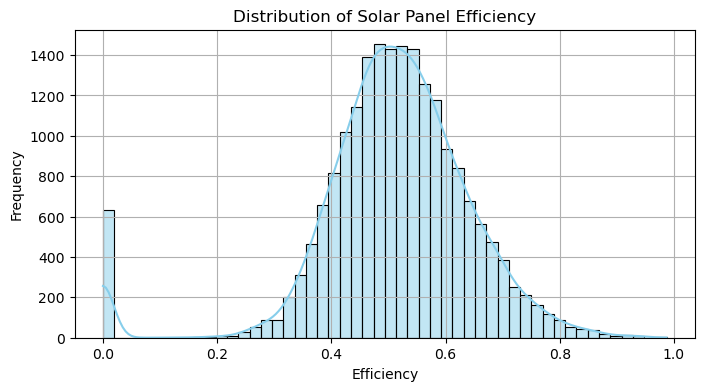

In [14]:
# Distribution of target
plt.figure(figsize=(8, 4))
sns.histplot(train['efficiency'], bins=50, kde=True, color='skyblue')
plt.title("Distribution of Solar Panel Efficiency")
plt.xlabel("Efficiency")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


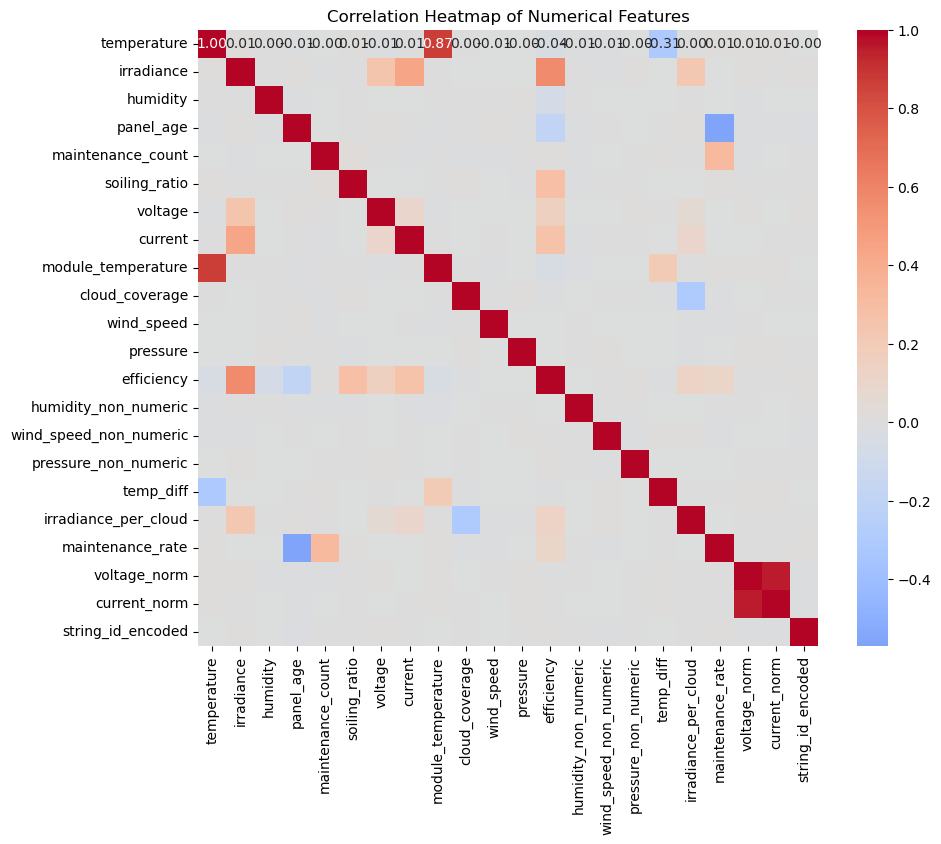

In [15]:
# Select only numeric features
numerical_cols = train.select_dtypes(include=[np.number]).drop(['id'], axis=1)

# Compute correlation with target
corr_matrix = numerical_cols.corr()

# Visualize
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', center=0)
plt.title("Correlation Heatmap of Numerical Features")
plt.show()



In [16]:
# Get correlation matrix from numerical features
numerical_cols = train.select_dtypes(include=[np.number]).drop(['id'], axis=1)
corr_matrix = numerical_cols.corr()

# Extract correlation of each feature with the target variable
target_corr = corr_matrix['efficiency'].drop('efficiency')

# Sort correlations in descending order of absolute value
sorted_corr = target_corr.sort_values(ascending=False, key=lambda x: x.abs())

# Convert to DataFrame for neat display
correlation_df = pd.DataFrame({
    'Feature': sorted_corr.index,
    'Correlation_with_Efficiency': sorted_corr.values
})

correlation_df.reset_index(drop=True, inplace=True)

# Display the ranked list
correlation_df


,Feature,Correlation_with_Efficiency
0,irradiance,0.567304
1,soiling_ratio,0.285740
2,current,0.262714
3,panel_age,-0.183716
4,voltage,0.151989
5,irradiance_per_cloud,0.127433
6,maintenance_rate,0.110440
7,humidity,-0.065438
8,module_temperature,-0.048378
9,temperature,-0.042834


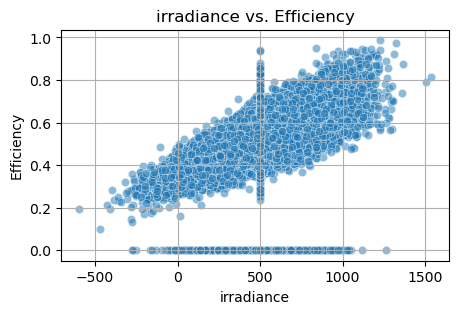

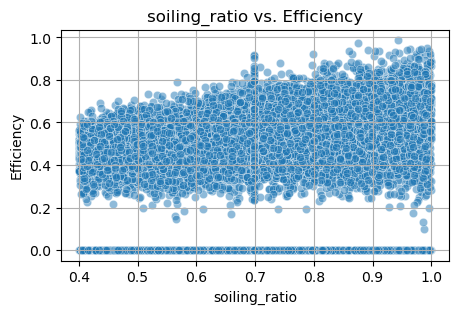

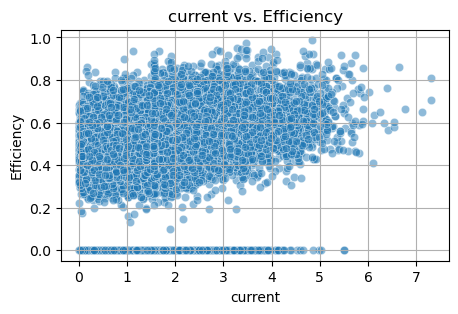

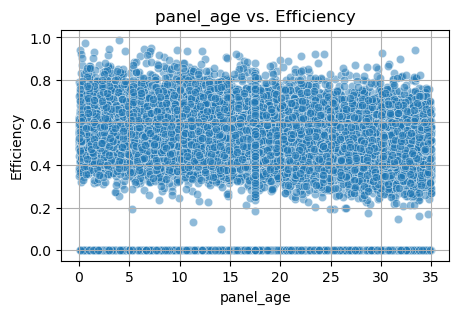

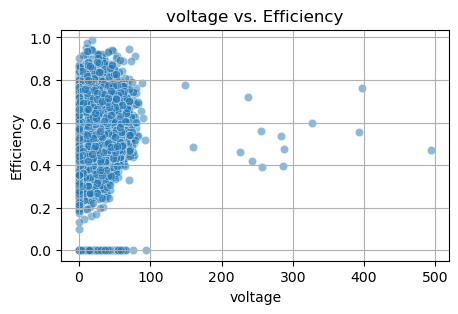

In [17]:
# Get top 5 positively and negatively correlated features (excluding target itself)
target_corr = corr_matrix['efficiency'].drop('efficiency')
top_features = target_corr.abs().sort_values(ascending=False).head(5).index.tolist()

# Scatter plots
for feature in top_features:
    plt.figure(figsize=(5, 3))
    sns.scatterplot(data=train, x=feature, y='efficiency', alpha=0.5)
    plt.title(f"{feature} vs. Efficiency")
    plt.xlabel(feature)
    plt.ylabel("Efficiency")
    plt.grid(True)
    plt.show()


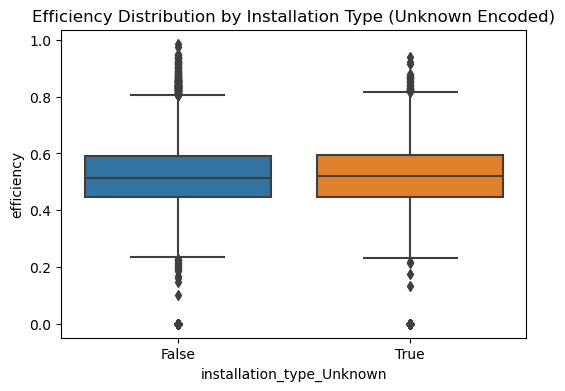

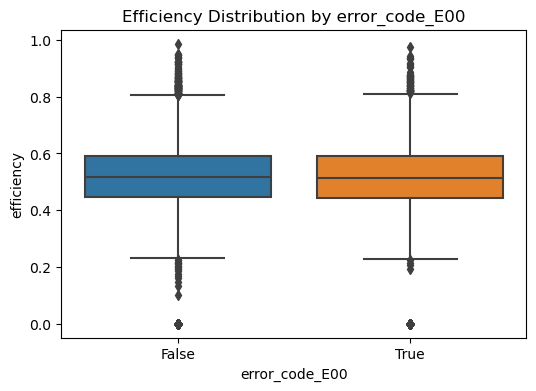

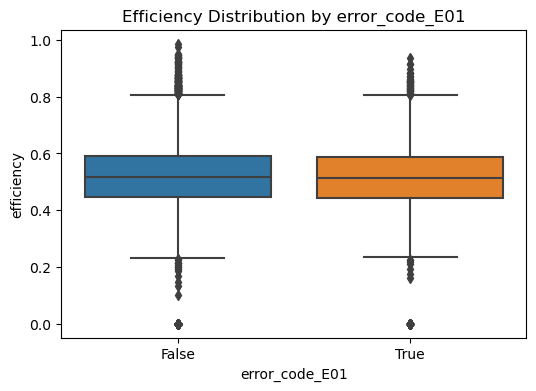

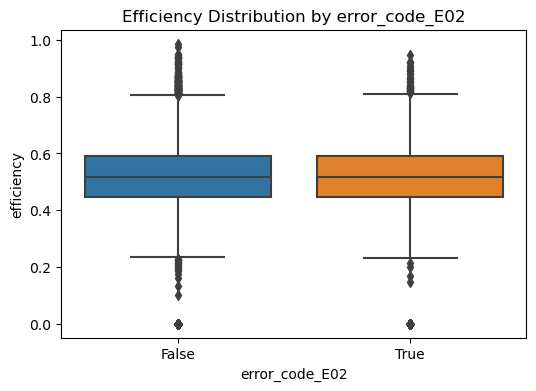

In [18]:
# Boxplot for installation_type
plt.figure(figsize=(6, 4))
sns.boxplot(data=train, x='installation_type_Unknown', y='efficiency')
plt.title("Efficiency Distribution by Installation Type (Unknown Encoded)")
plt.show()

# Boxplot for a sample error_code
sample_error_code_cols = [col for col in train.columns if col.startswith("error_code_")][:3]

for col in sample_error_code_cols:
    plt.figure(figsize=(6, 4))
    sns.boxplot(data=train, x=col, y='efficiency')
    plt.title(f"Efficiency Distribution by {col}")
    plt.show()


## 📌 Exploratory Data Analysis (EDA) Summary

### 🎯 Target Distribution
- The target variable `efficiency` is approximately normally distributed around **0.5**, with a sharp spike at **0**, suggesting non-operational or faulty panels.

---

### 🔍 Continuous Feature Relationships

- **Irradiance**: Strong positive correlation with efficiency, as expected in solar energy systems. However, there are non-zero irradiance values associated with zero efficiency, suggesting panel or system faults.
- **Soiling Ratio**: Cleaner panels (higher soiling ratio) generally have better efficiency, although the relationship is noisy.
- **Current**: Positively related to efficiency but with several cases where high current doesn’t guarantee high output — possibly due to system issues.
- **Panel Age**: Slight negative trend — efficiency tends to decrease with older panels.
- **Voltage**: Most data is clustered at lower voltages. There are high-voltage outliers with wide efficiency variance, hinting at outlier or error conditions.

---

### 🧩 Categorical Feature Effects (One-Hot Encoded)

- **Installation Type (Unknown)**: Surprisingly, panels with unknown installation types show a slightly higher median efficiency. May indicate newly installed or unclassified high-performance setups.
- **Error Codes**:
  - **E00**: Panels with `E00` errors show slightly lower median efficiency, indicating common operational faults.
  - **E01**: Similar trend to `E00` — suggests faults captured by this code also impact output.
  - **E02**: Median efficiency is moderately lower in panels with `E02`, though the effect is subtle. All three error codes appear to contain useful signals.

---

### 📈 Final Observations

- `irradiance`, `soiling_ratio`, and `current` are the strongest continuous predictors of efficiency.
- Diagnostic logs (`error_code`) and installation details are **informative categorical variables**.
- Many **panels operate with zero efficiency**, even under good environmental conditions — this highlights the value of incorporating **maintenance, age, and error data**.
- Nonlinear, interactive patterns justify using **LightGBM**, a gradient boosting model capable of handling such complexity effectively.

---

✅ We now proceed to model building using LightGBM and K-Fold Cross-Validation.


We chose LightGBM due to its strong performance on tabular data, efficient handling of large datasets, and ability to model complex nonlinear interactions between environmental, operational, and categorical features. Since our evaluation metric is based on RMSE, and LightGBM natively optimizes for MSE loss, it aligns perfectly with the task requirements.


## 🧠 Model Training: LightGBM with 5-Fold Cross-Validation

We now train a LightGBM regression model using 5-Fold cross-validation to ensure robust performance.
The evaluation metric is Root Mean Squared Error (RMSE), which directly aligns with the competition's scoring rule.


In [22]:
def xgb_objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.05),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'random_state': 42,
        'n_jobs': -1
    }

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    rmse_scores = []

    for train_idx, val_idx in kf.split(X):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

        model = xgb.XGBRegressor(**params)
        model.fit(X_train, y_train)
        preds = model.predict(X_val)
        rmse_scores.append(mean_squared_error(y_val, preds, squared=False))

    return np.mean(rmse_scores)

In [23]:
print("🔍 Optimizing XGBoost...")
xgb_study = optuna.create_study(direction='minimize')
xgb_study.optimize(xgb_objective, n_trials=50)
print("✅ Best XGBoost RMSE:", xgb_study.best_value)
print("🔧 Params:", xgb_study.best_params)

🔁 Fold 1
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001847 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
✅ Fold 1 Score = 89.2460
🔁 Fold 2
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.509987
✅ Fold 2 Score = 89.7526
🔁 Fold 3
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

In [24]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
lgb_oof, xgb_oof, y_oof = [], [], []
lgb_test, xgb_test = [], []

for train_idx, val_idx in kf.split(X):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    lgb_model = lgb.LGBMRegressor(**lgb_study.best_params)
    xgb_model = xgb.XGBRegressor(**xgb_study.best_params)

    lgb_model.fit(X_train, y_train)
    xgb_model.fit(X_train, y_train)

    lgb_oof.extend(lgb_model.predict(X_val))
    xgb_oof.extend(xgb_model.predict(X_val))
    y_oof.extend(y_val)

    lgb_test.append(lgb_model.predict(X_test))
    xgb_test.append(xgb_model.predict(X_test))


In [25]:
meta_X = np.vstack([lgb_oof, xgb_oof]).T
meta_model = RidgeCV()
meta_model.fit(meta_X, y_oof)

# Predict test
test_preds_stacked = meta_model.predict(np.vstack([
    np.mean(lgb_test, axis=0),
    np.mean(xgb_test, axis=0)
]).T)


[I 2025-06-09 02:49:30,443] A new study created in memory with name: no-name-7c746296-3661-4266-9c75-3b227c4b5c79


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:50:07,345] Trial 0 finished with value: 0.10390862715078923 and parameters: {'n_estimators': 1173, 'learning_rate': 0.006781803755254275, 'num_leaves': 74, 'max_depth': 11, 'subsample': 0.8708764483993092, 'colsample_bytree': 0.710223355539843}. Best is trial 0 with value: 0.10390862715078923.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start tra

[I 2025-06-09 02:50:26,547] Trial 1 finished with value: 0.10399383661608778 and parameters: {'n_estimators': 1386, 'learning_rate': 0.013125676556899817, 'num_leaves': 27, 'max_depth': 10, 'subsample': 0.8411107884939619, 'colsample_bytree': 0.8389131911051522}. Best is trial 0 with value: 0.10390862715078923.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:51:07,468] Trial 2 finished with value: 0.1073925885210117 and parameters: {'n_estimators': 1714, 'learning_rate': 0.03213284886548182, 'num_leaves': 53, 'max_depth': 8, 'subsample': 0.6829829241724167, 'colsample_bytree': 0.9159063829598836}. Best is trial 0 with value: 0.10390862715078923.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:52:00,697] Trial 3 finished with value: 0.1057292695673557 and parameters: {'n_estimators': 1094, 'learning_rate': 0.01766169479361721, 'num_leaves': 137, 'max_depth': 12, 'subsample': 0.6696562957341758, 'colsample_bytree': 0.7721847308432219}. Best is trial 0 with value: 0.10390862715078923.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:52:32,679] Trial 4 finished with value: 0.10705892727013991 and parameters: {'n_estimators': 1797, 'learning_rate': 0.040340363987725496, 'num_leaves': 74, 'max_depth': 6, 'subsample': 0.8571173100394762, 'colsample_bytree': 0.5823869892843254}. Best is trial 0 with value: 0.10390862715078923.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:53:10,508] Trial 5 finished with value: 0.10649049834481861 and parameters: {'n_estimators': 1169, 'learning_rate': 0.038801536209354746, 'num_leaves': 85, 'max_depth': 12, 'subsample': 0.7715001309795175, 'colsample_bytree': 0.5293651976485323}. Best is trial 0 with value: 0.10390862715078923.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:53:17,534] Trial 6 finished with value: 0.10323329229159559 and parameters: {'n_estimators': 902, 'learning_rate': 0.024786509889047355, 'num_leaves': 35, 'max_depth': 3, 'subsample': 0.9192081474989897, 'colsample_bytree': 0.5425311894977263}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start tra

[I 2025-06-09 02:53:46,384] Trial 7 finished with value: 0.10520503502519025 and parameters: {'n_estimators': 1520, 'learning_rate': 0.02445766068626982, 'num_leaves': 47, 'max_depth': 14, 'subsample': 0.5088791359049194, 'colsample_bytree': 0.5894727198666121}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:53:54,105] Trial 8 finished with value: 0.10362853445852575 and parameters: {'n_estimators': 957, 'learning_rate': 0.03822204853844433, 'num_leaves': 38, 'max_depth': 3, 'subsample': 0.9996342787420265, 'colsample_bytree': 0.7606287241658958}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:55:11,410] Trial 9 finished with value: 0.10533276684065025 and parameters: {'n_estimators': 1990, 'learning_rate': 0.012655449640133667, 'num_leaves': 104, 'max_depth': 10, 'subsample': 0.640968869096625, 'colsample_bytree': 0.523833944506252}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:55:15,535] Trial 10 finished with value: 0.10349702348092849 and parameters: {'n_estimators': 522, 'learning_rate': 0.0492924594970248, 'num_leaves': 113, 'max_depth': 3, 'subsample': 0.9988959608762975, 'colsample_bytree': 0.9886420976474419}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-09 02:55:19,447] Trial 11 finished with value: 0.10348629595378656 and parameters: {'n_estimators': 527, 'learning_rate': 0.04745804419904233, 'num_leaves': 111, 'max_depth': 3, 'subsample': 0.9868937568249234, 'colsample_bytree': 0.9978205077264399}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-09 02:55:31,590] Trial 12 finished with value: 0.10414540411627238 and parameters: {'n_estimators': 599, 'learning_rate': 0.026825590320418605, 'num_leaves': 131, 'max_depth': 6, 'subsample': 0.9349947887943256, 'colsample_bytree': 0.6736232870363611}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:55:43,870] Trial 13 finished with value: 0.10542321926053802 and parameters: {'n_estimators': 825, 'learning_rate': 0.04956571259851158, 'num_leaves': 98, 'max_depth': 5, 'subsample': 0.9201776522269407, 'colsample_bytree': 0.8562597268385875}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:55:52,802] Trial 14 finished with value: 0.10350105108069256 and parameters: {'n_estimators': 765, 'learning_rate': 0.02302482441993642, 'num_leaves': 118, 'max_depth': 4, 'subsample': 0.790574071494379, 'colsample_bytree': 0.9901190744743827}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:56:15,355] Trial 15 finished with value: 0.1047917805151906 and parameters: {'n_estimators': 703, 'learning_rate': 0.03236595396145117, 'num_leaves': 150, 'max_depth': 7, 'subsample': 0.9384125497480192, 'colsample_bytree': 0.6517260946215679}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:56:31,487] Trial 16 finished with value: 0.10528713089813482 and parameters: {'n_estimators': 950, 'learning_rate': 0.04357010414457966, 'num_leaves': 63, 'max_depth': 5, 'subsample': 0.919174335344673, 'colsample_bytree': 0.833920940424945}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:56:35,890] Trial 17 finished with value: 0.10323928104069031 and parameters: {'n_estimators': 521, 'learning_rate': 0.031243895596291524, 'num_leaves': 94, 'max_depth': 3, 'subsample': 0.9918074801116799, 'colsample_bytree': 0.9200687492963038}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-09 02:56:50,404] Trial 18 finished with value: 0.10468573159311681 and parameters: {'n_estimators': 955, 'learning_rate': 0.03309188039847337, 'num_leaves': 22, 'max_depth': 8, 'subsample': 0.8178810204443742, 'colsample_bytree': 0.9111134828419817}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Lig

[I 2025-06-09 02:57:21,697] Trial 19 finished with value: 0.10440467847691026 and parameters: {'n_estimators': 681, 'learning_rate': 0.01719192016538633, 'num_leaves': 85, 'max_depth': 15, 'subsample': 0.7199627642395325, 'colsample_bytree': 0.614670929762391}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:57:42,372] Trial 20 finished with value: 0.10452004833975374 and parameters: {'n_estimators': 1353, 'learning_rate': 0.021983484704209237, 'num_leaves': 59, 'max_depth': 5, 'subsample': 0.5974086612608771, 'colsample_bytree': 0.7944678103269702}. Best is trial 6 with value: 0.10323329229159559.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:57:48,451] Trial 21 finished with value: 0.10319699013538783 and parameters: {'n_estimators': 532, 'learning_rate': 0.029076395761760885, 'num_leaves': 95, 'max_depth': 3, 'subsample': 0.9618758874241365, 'colsample_bytree': 0.9340740906421066}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-09 02:58:00,926] Trial 22 finished with value: 0.10377178471481704 and parameters: {'n_estimators': 839, 'learning_rate': 0.028488209873038548, 'num_leaves': 91, 'max_depth': 4, 'subsample': 0.8837291402163652, 'colsample_bytree': 0.9173853292338188}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-06-09 02:58:09,179] Trial 23 finished with value: 0.10359288334026966 and parameters: {'n_estimators': 624, 'learning_rate': 0.02928687317061172, 'num_leaves': 100, 'max_depth': 4, 'subsample': 0.9461972405770873, 'colsample_bytree': 0.9439631641417747}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-09 02:58:16,608] Trial 24 finished with value: 0.10350691578288691 and parameters: {'n_estimators': 872, 'learning_rate': 0.03547885576583293, 'num_leaves': 71, 'max_depth': 3, 'subsample': 0.8931707269348268, 'colsample_bytree': 0.8754513600071883}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-06-09 02:58:29,565] Trial 25 finished with value: 0.10374820924175485 and parameters: {'n_estimators': 516, 'learning_rate': 0.019699470761906424, 'num_leaves': 122, 'max_depth': 6, 'subsample': 0.9657804761462107, 'colsample_bytree': 0.8016747763338752}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:58:40,765] Trial 26 finished with value: 0.10381129905878876 and parameters: {'n_estimators': 1061, 'learning_rate': 0.026396093153043927, 'num_leaves': 87, 'max_depth': 4, 'subsample': 0.965243656145543, 'colsample_bytree': 0.7206346337162883}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:58:59,716] Trial 27 finished with value: 0.10478558137218771 and parameters: {'n_estimators': 697, 'learning_rate': 0.03035511014221761, 'num_leaves': 36, 'max_depth': 7, 'subsample': 0.8215858465000353, 'colsample_bytree': 0.9550157813759624}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:59:11,708] Trial 28 finished with value: 0.1046152264084111 and parameters: {'n_estimators': 755, 'learning_rate': 0.03539880379702242, 'num_leaves': 78, 'max_depth': 5, 'subsample': 0.8991621124657848, 'colsample_bytree': 0.8910958024595841}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 02:59:18,083] Trial 29 finished with value: 0.1035212337087896 and parameters: {'n_estimators': 605, 'learning_rate': 0.008455726388815824, 'num_leaves': 66, 'max_depth': 3, 'subsample': 0.8717575980771609, 'colsample_bytree': 0.9530678884732273}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-09 02:59:56,594] Trial 30 finished with value: 0.10558285740452941 and parameters: {'n_estimators': 1250, 'learning_rate': 0.02493047281741233, 'num_leaves': 93, 'max_depth': 7, 'subsample': 0.964954878677078, 'colsample_bytree': 0.6909955023517813}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:00:03,513] Trial 31 finished with value: 0.10339374921706859 and parameters: {'n_estimators': 517, 'learning_rate': 0.046564169321096055, 'num_leaves': 109, 'max_depth': 3, 'subsample': 0.9933842072449279, 'colsample_bytree': 0.9832118583679267}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:00:23,121] Trial 32 finished with value: 0.10384985692026931 and parameters: {'n_estimators': 594, 'learning_rate': 0.0426295422565914, 'num_leaves': 105, 'max_depth': 4, 'subsample': 0.9690726280702134, 'colsample_bytree': 0.9501911846248723}. Best is trial 21 with value: 0.10319699013538783.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

[I 2025-06-09 03:00:31,144] Trial 33 finished with value: 0.10319074861571916 and parameters: {'n_estimators': 660, 'learning_rate': 0.021265268977031137, 'num_leaves': 127, 'max_depth': 3, 'subsample': 0.910766532657208, 'colsample_bytree': 0.8213429530387591}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-09 03:00:41,192] Trial 34 finished with value: 0.10332441422667368 and parameters: {'n_estimators': 782, 'learning_rate': 0.014170871320320985, 'num_leaves': 129, 'max_depth': 4, 'subsample': 0.8396292302661766, 'colsample_bytree': 0.8362084376333625}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:01:18,466] Trial 35 finished with value: 0.10465299822574758 and parameters: {'n_estimators': 681, 'learning_rate': 0.019052492244955605, 'num_leaves': 145, 'max_depth': 9, 'subsample': 0.906308007453015, 'colsample_bytree': 0.7272268698712133}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:01:33,743] Trial 36 finished with value: 0.10402314774499839 and parameters: {'n_estimators': 891, 'learning_rate': 0.02177957938023284, 'num_leaves': 78, 'max_depth': 5, 'subsample': 0.8641079800075331, 'colsample_bytree': 0.8143312874689517}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:01:57,979] Trial 37 finished with value: 0.10419513682152996 and parameters: {'n_estimators': 1082, 'learning_rate': 0.015263465085834158, 'num_leaves': 54, 'max_depth': 6, 'subsample': 0.7392525563514949, 'colsample_bytree': 0.8805693237848806}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:02:38,981] Trial 38 finished with value: 0.1063214773894778 and parameters: {'n_estimators': 633, 'learning_rate': 0.03452235507080911, 'num_leaves': 138, 'max_depth': 13, 'subsample': 0.9413770362145417, 'colsample_bytree': 0.7793328694358338}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.509987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003

[I 2025-06-09 03:03:14,777] Trial 39 finished with value: 0.10514093725497922 and parameters: {'n_estimators': 1465, 'learning_rate': 0.024619309965226373, 'num_leaves': 44, 'max_depth': 11, 'subsample': 0.8529392381535437, 'colsample_bytree': 0.5485047536367389}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:03:21,088] Trial 40 finished with value: 0.10327784040224082 and parameters: {'n_estimators': 747, 'learning_rate': 0.030273086861550225, 'num_leaves': 28, 'max_depth': 3, 'subsample': 0.7838917522105072, 'colsample_bytree': 0.7504132668644435}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:03:27,135] Trial 41 finished with value: 0.10333761508499424 and parameters: {'n_estimators': 728, 'learning_rate': 0.03029087563290426, 'num_leaves': 32, 'max_depth': 3, 'subsample': 0.7910412056293423, 'colsample_bytree': 0.7267478568689674}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:03:31,549] Trial 42 finished with value: 0.10319436919683536 and parameters: {'n_estimators': 566, 'learning_rate': 0.02712135225831289, 'num_leaves': 21, 'max_depth': 3, 'subsample': 0.6865550699856758, 'colsample_bytree': 0.7608859505151448}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:03:38,277] Trial 43 finished with value: 0.10341593385809364 and parameters: {'n_estimators': 567, 'learning_rate': 0.026542101667248543, 'num_leaves': 24, 'max_depth': 4, 'subsample': 0.6476025765326963, 'colsample_bytree': 0.9138366606759312}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:03:43,507] Trial 44 finished with value: 0.10333074459748401 and parameters: {'n_estimators': 629, 'learning_rate': 0.037821522957100076, 'num_leaves': 20, 'max_depth': 3, 'subsample': 0.6896559766491005, 'colsample_bytree': 0.8550835083143902}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:03:49,048] Trial 45 finished with value: 0.1032380829067591 and parameters: {'n_estimators': 513, 'learning_rate': 0.020746095212176702, 'num_leaves': 120, 'max_depth': 4, 'subsample': 0.5465857702880842, 'colsample_bytree': 0.6231409714633885}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:04:10,162] Trial 46 finished with value: 0.1038724854221759 and parameters: {'n_estimators': 1687, 'learning_rate': 0.021054760412842887, 'num_leaves': 123, 'max_depth': 4, 'subsample': 0.5097334370172021, 'colsample_bytree': 0.5616647443803322}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:04:25,001] Trial 47 finished with value: 0.1040259353282283 and parameters: {'n_estimators': 1003, 'learning_rate': 0.023269515351036225, 'num_leaves': 42, 'max_depth': 5, 'subsample': 0.5710045854882195, 'colsample_bytree': 0.628583703400756}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:04:41,467] Trial 48 finished with value: 0.10372733436512968 and parameters: {'n_estimators': 800, 'learning_rate': 0.016396045003436013, 'num_leaves': 116, 'max_depth': 6, 'subsample': 0.5442865801969352, 'colsample_bytree': 0.5187457139818352}. Best is trial 33 with value: 0.10319074861571916.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4120
[LightGBM] [Info] Number of data points in the train set: 16000, number of used features: 29
[LightGBM] [Info] Start training from score 0.511069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-06-09 03:05:03,113] Trial 49 finished with value: 0.10383074588679927 and parameters: {'n_estimators': 1149, 'learning_rate': 0.018927411200072134, 'num_leaves': 134, 'max_depth': 5, 'subsample': 0.6101079633026882, 'colsample_bytree': 0.5061159879893221}. Best is trial 33 with value: 0.10319074861571916.


In [26]:
submission = pd.DataFrame({
    'id': test['id'],
    'efficiency': test_preds_stacked
})

submission.to_csv("submissionfinal.csv", index=False)

Best RMSE: 0.10319074861571916
Best Parameters: {'n_estimators': 660, 'learning_rate': 0.021265268977031137, 'num_leaves': 127, 'max_depth': 3, 'subsample': 0.910766532657208, 'colsample_bytree': 0.8213429530387591}


## 🔍 Feature Importance Insights

The top 3 most influential features wer

1. **Irradiance** – the key driver of energy generation
2. **Soiling Ratio** – directly impacts panel exposure and cleanlinesst3on
3. **Panel Age** – reflects natural performance degradation over takeholders.
